In [36]:
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib
from plotnine import *
import pandas as pd
import numpy as np
import scanpy as sc
from data_loader import load_data
from prismo import PRISMO
from prismo.pl import plot_variance_explained, plot_training_curve, plot_top_weights

tab10_colors = [matplotlib.cm.tab10(i) for i in range(10)]
tab10_colors = [matplotlib.colors.rgb2hex(color) for color in tab10_colors]
tab20_colors = [matplotlib.cm.tab20(i) for i in range(20)]
tab20_colors = [matplotlib.colors.rgb2hex(color) for color in tab20_colors]

In [2]:
data = load_data()
model = PRISMO.load("model.h5")

## Data overview

In [3]:
data_df = []
for group in model.group_names:
    data_df.append(data[group]["rna"].obs)
data_df = pd.concat(data_df)

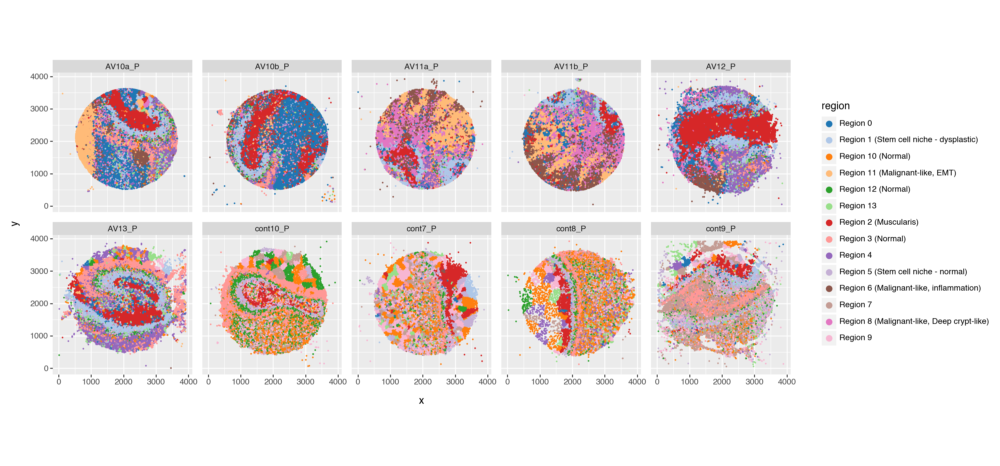

In [4]:
plot = (
    ggplot(data_df, aes(x="x", y="y", color="region"))
    + geom_point(size=0.01)
    + theme(figure_size=(15, 7))
    + scale_color_manual(values=tab20_colors)
    + facet_wrap("~SampleID", ncol=5)
    + coord_fixed()
    + guides(color=guide_legend(override_aes={"size": 3}))
)
plot.show()

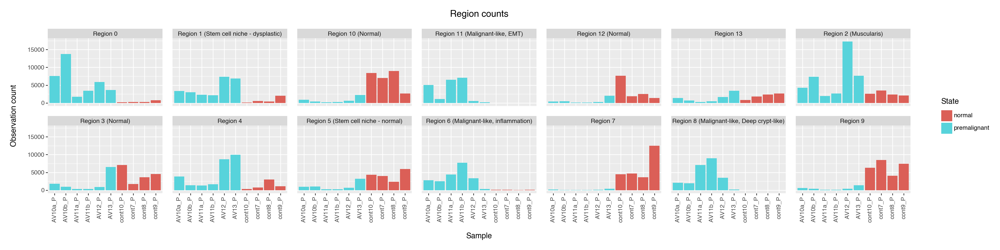

In [5]:
plot = (
    ggplot(data_df, aes(x="SampleID", fill="State"))
    + geom_bar()
    + facet_wrap("~region", ncol=7)
    + theme(figure_size=(20, 5), axis_text_x=element_text(rotation=90))
    + labs(x="Sample", y="Observation count", title="Region counts")
)
plot.show()

In [6]:
r2 = model.get_r2()

r2_list = pd.concat([r2[x] for x in r2.keys()], axis=1)
r2_list.columns = r2.keys()

top_factors = r2_list.mean(axis=1).sort_values(ascending=False).index[:25]
top_factors = top_factors.str.replace("HALLMARK_", "").str.replace("_", " ").str.title()

In [7]:
z = model.get_factors()

z_list = []
for group in z.keys():
    df = z[group].reset_index(names="barcode")
    df["x"] = model.covariates[group][:, 0]
    df["y"] = model.covariates[group][:, 1]
    df["state"] = model._metadata[group]["rna"]["State"].values
    df["region"] = model._metadata[group]["rna"]["region"].values
    df["epi_domain"] = model._metadata[group]["rna"]["epi_domain"].values
    df = df.melt(id_vars=["barcode", "x", "y", "state", "region", "epi_domain"], var_name="factor", value_name="score")
    df["group"] = group

    z_list.append(df)

z_long = pd.concat(z_list)
z_long["factor"] = z_long["factor"].str.replace("HALLMARK_", "").str.replace("_", " ").str.title()
z_long = z_long[z_long["factor"].isin(top_factors)]
z_long["factor"] = pd.Categorical(z_long["factor"], categories=top_factors, ordered=True)

/tmp/ipykernel_25210/3276519530.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


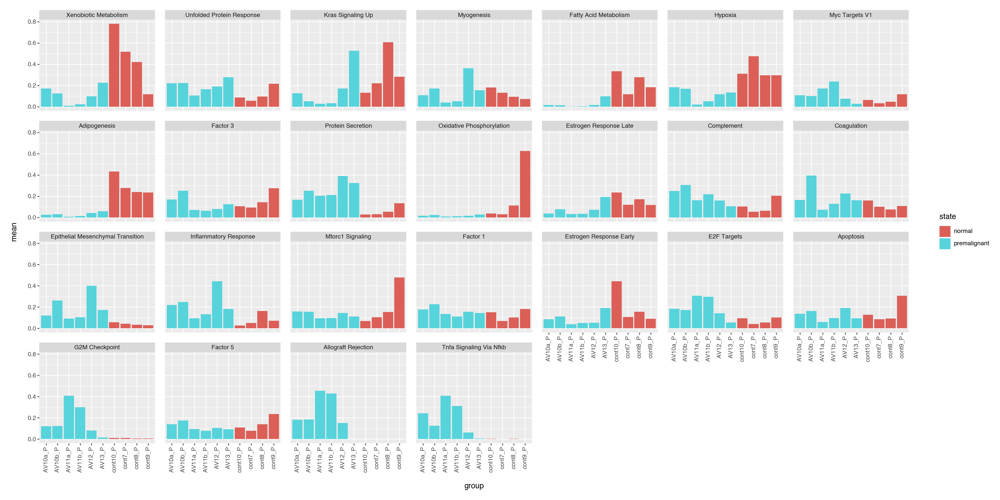

In [8]:
z_long_grouped = z_long.groupby(["group", "state", "factor"])["score"].agg(["max", "mean", "std"]).reset_index().dropna()

plot = (
    ggplot(z_long_grouped, aes(x="group", y="mean", fill="state"))
    + geom_bar(aes(group="group"), stat="identity", position="dodge")
    + theme(figure_size=(20, 10), axis_text_x=element_text(angle=90))
    + facet_wrap("~factor", ncol=7)
)
plot.show()

/tmp/ipykernel_25210/1706049768.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


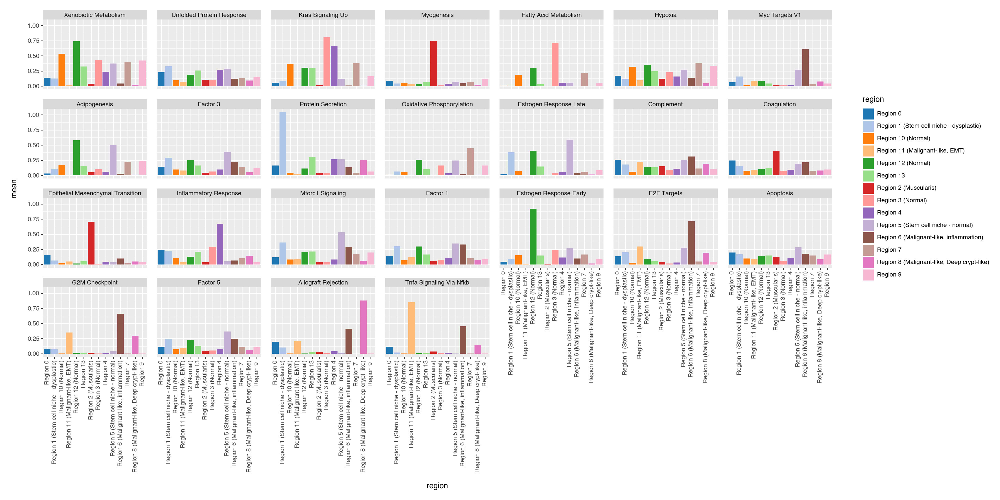

In [9]:
z_long_grouped = z_long.groupby(["region", "factor"])["score"].agg(["max", "mean", "std"]).reset_index().dropna()

plot = (
    ggplot(z_long_grouped, aes(x="region", y="mean", fill="region"))
    + geom_bar(aes(group="region"), stat="identity", position="dodge")
    + theme(figure_size=(20, 10), axis_text_x=element_text(angle=90))
    + scale_fill_manual(values=tab20_colors)
    + facet_wrap("~factor", ncol=7)
)
plot.show()

In [10]:
# factors = [
#     "Xenobiotic Metabolism",
#     "Unfolded Protein Response",
#     "Tnfa Signaling Via Nfkb",
#     "Allograft Rejection",
#     "G2M Checkpoint"
# ]

# for factor in factors:
#     plot = (
#         ggplot(z_long[z_long["factor"] == factor], aes(x="x", y="y", color="score"))
#         + geom_point(size=0.1)
#         + facet_wrap("group", ncol=5)
#         + theme(figure_size=(15, 7), axis_text_x=element_blank(), axis_text_y=element_blank())
#         + scale_color_cmap("Blues")
#         + labs(title=factor)
#         + coord_fixed(ratio=1)
#     )
#     plot.show()

In [39]:
r2_list = []
for group in model.get_r2().keys():
    r2 = model.get_r2()[group].rename(columns={"rna":group}).T
    r2["state"] = model._metadata[group]["rna"]["State"].unique()[0]
    r2["group"] = group
    r2_list.append(r2)
r2_list = pd.concat(r2_list)

r2_long = r2_list.melt(id_vars=["group", "state"], var_name="factor", value_name="r2")
r2_long["factor"] = r2_long["factor"].str.replace("HALLMARK_", "").str.replace("_", " ").str.title()
r2_long_grouped = r2_long.groupby(["group", "state", "factor"])["r2"].agg(["mean", "std"]).reset_index()

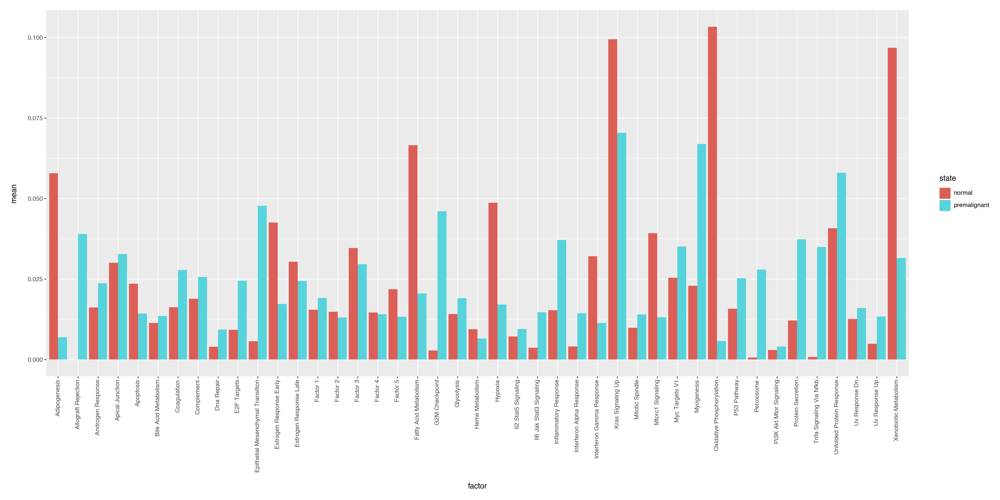

In [40]:
plot = (
    ggplot(r2_long_grouped, aes(x="factor", y="mean", fill="state"))
    + geom_bar(stat="identity", position="dodge")
    + theme(figure_size=(20, 10), axis_text_x=element_text(angle=90))
)
plot.show()

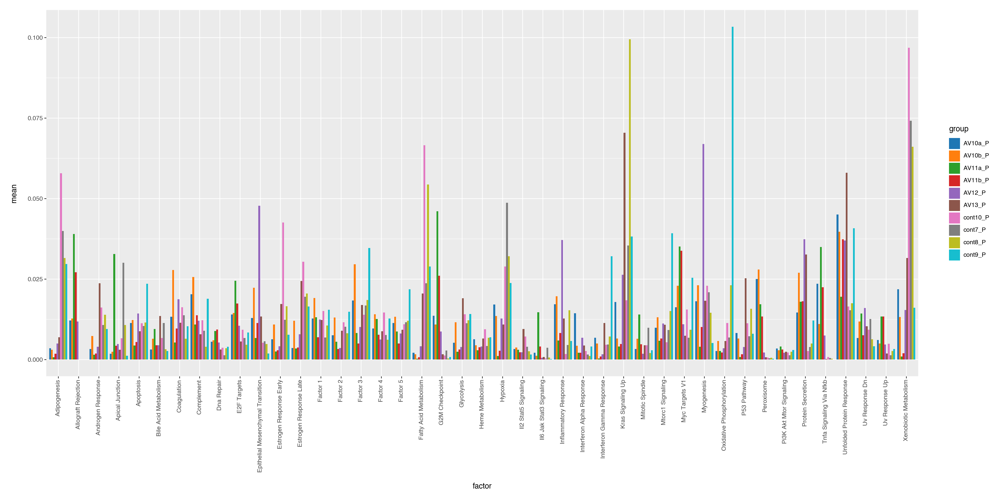

In [41]:
plot = (
    ggplot(r2_long_grouped, aes(x="factor", y="mean", fill="group"))
    + geom_bar(stat="identity", position="dodge")
    + theme(figure_size=(20, 10), axis_text_x=element_text(angle=90))
    + scale_fill_manual(values=tab10_colors)
)
plot.show()

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


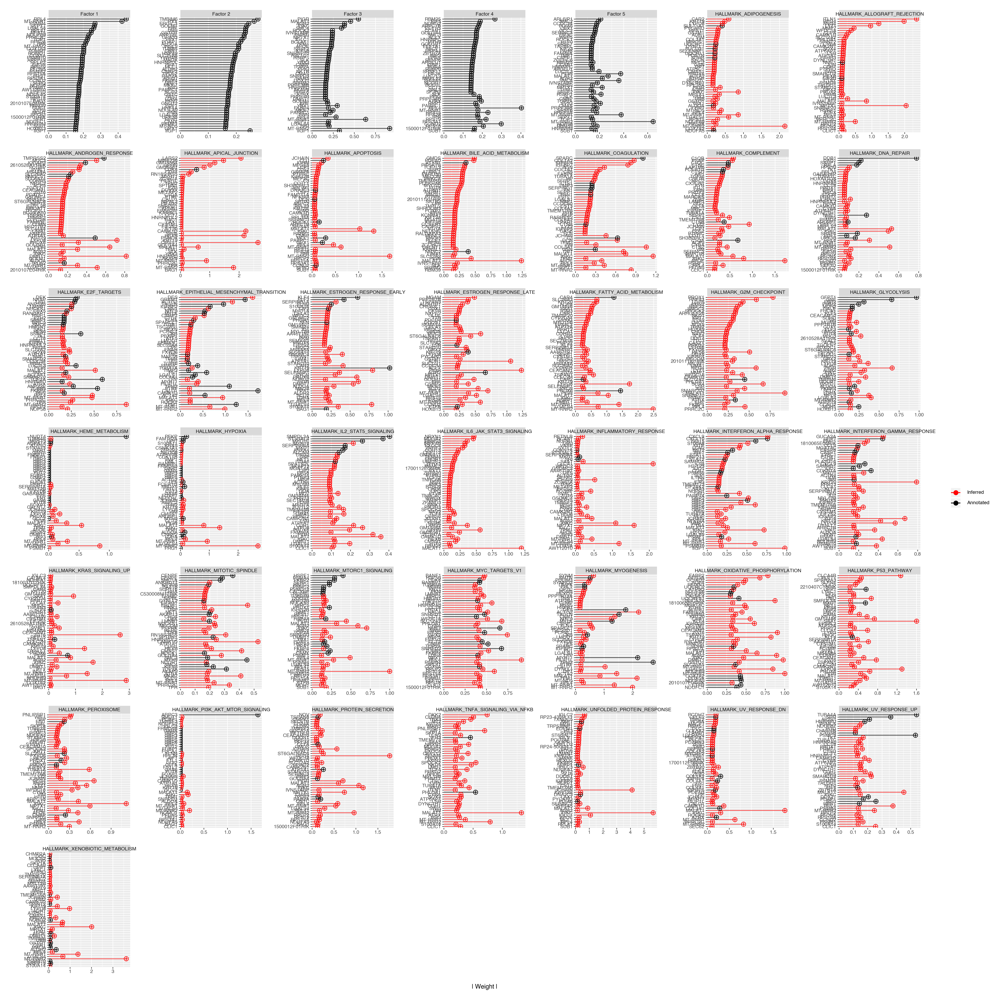

In [52]:
plot_top_weights(model, 50, figsize=(25, 25))

In [56]:
r2_long

,group,state,factor,r2
0,AV10a_P,premalignant,Factor 1,0.012705
1,AV10b_P,premalignant,Factor 1,0.019081
2,AV11a_P,premalignant,Factor 1,0.013124
3,AV11b_P,premalignant,Factor 1,0.006884
4,AV12_P,premalignant,Factor 1,0.012400
...,...,...,...,...
425,AV13_P,premalignant,Xenobiotic Metabolism,0.031513
426,cont10_P,normal,Xenobiotic Metabolism,0.096830
427,cont7_P,normal,Xenobiotic Metabolism,0.074140
428,cont8_P,normal,Xenobiotic Metabolism,0.066088


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


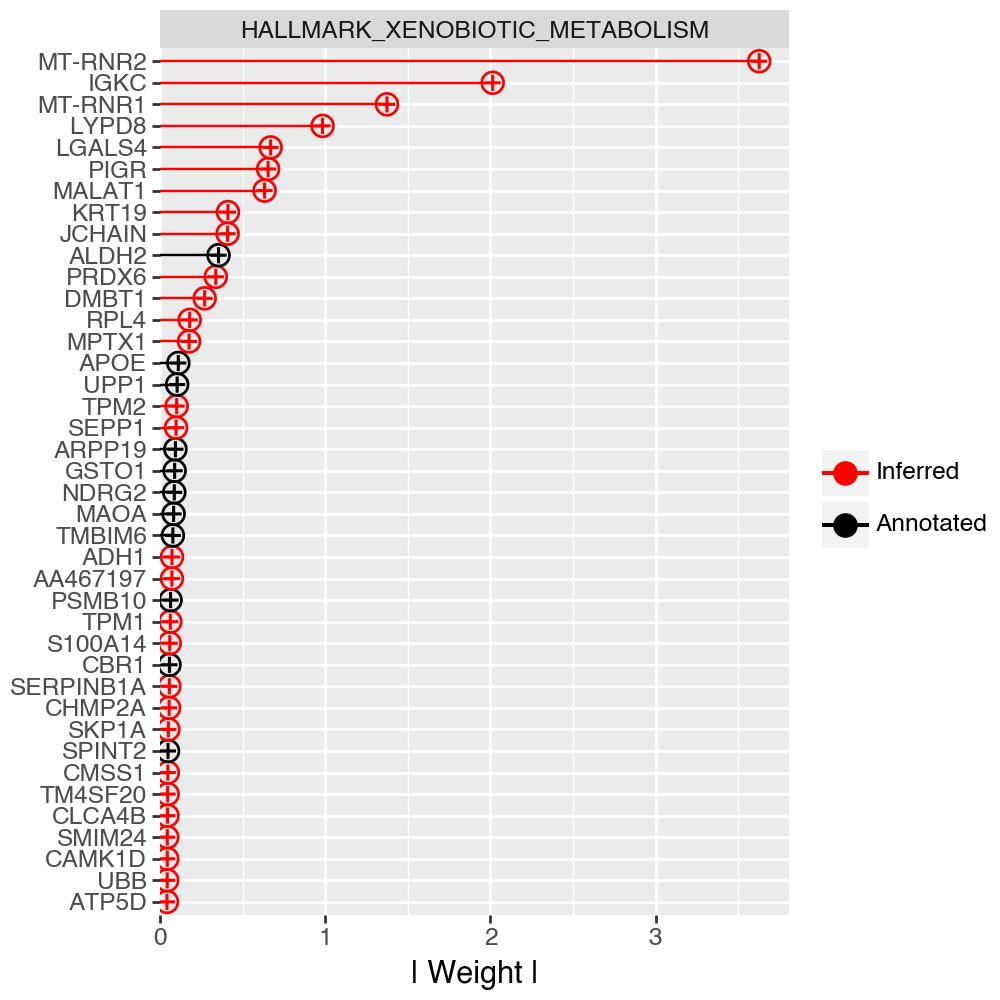

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


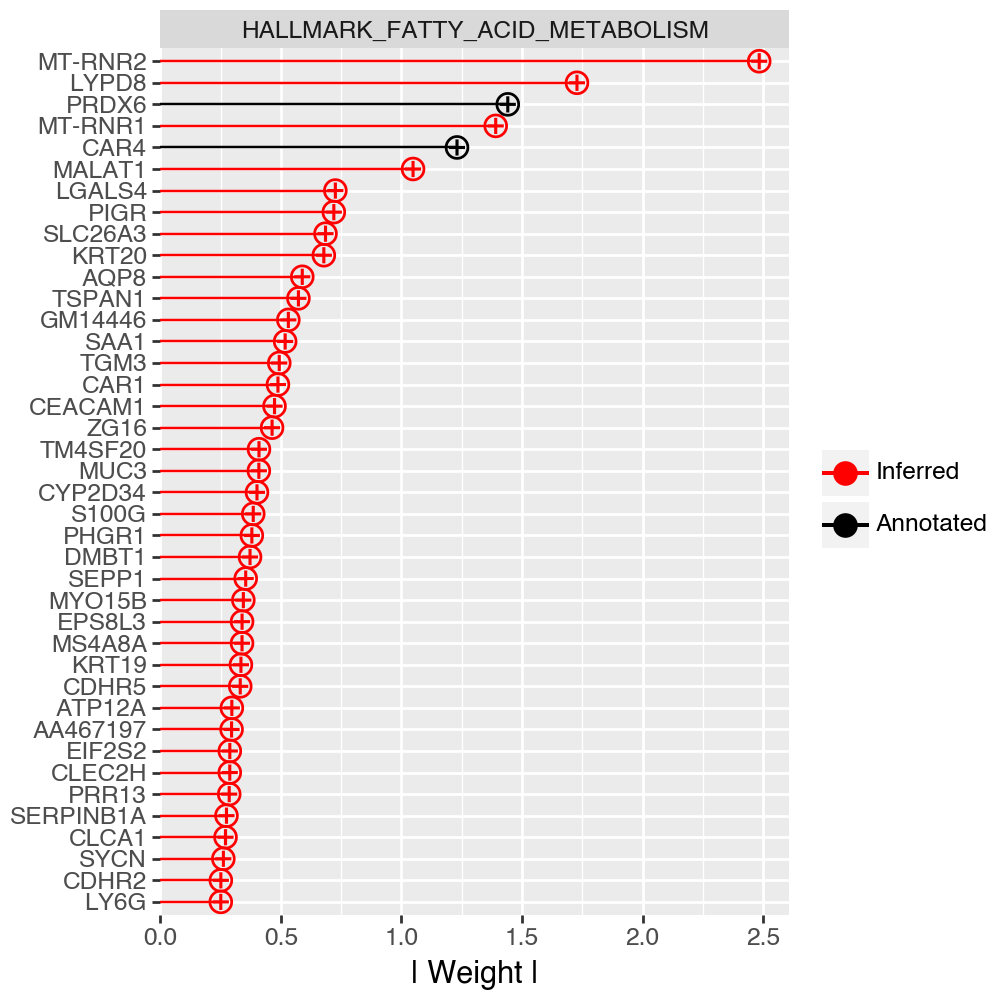

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


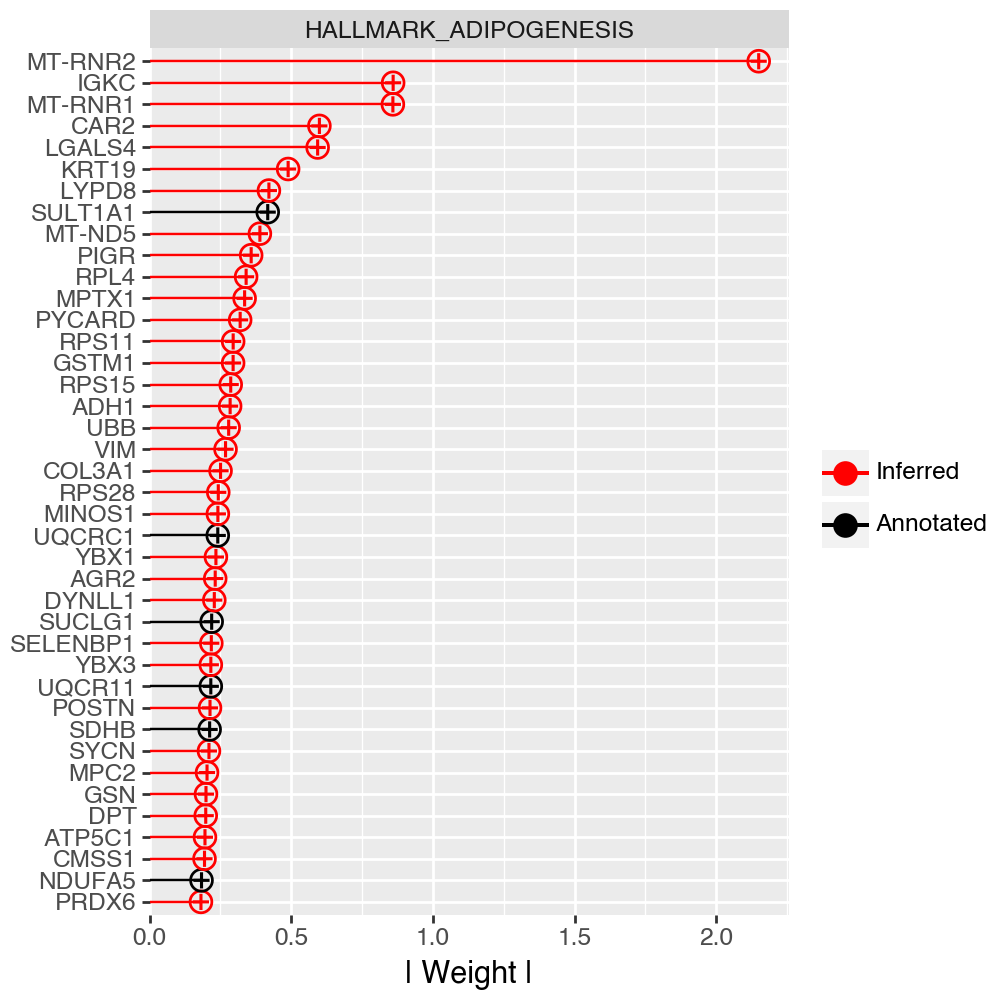

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


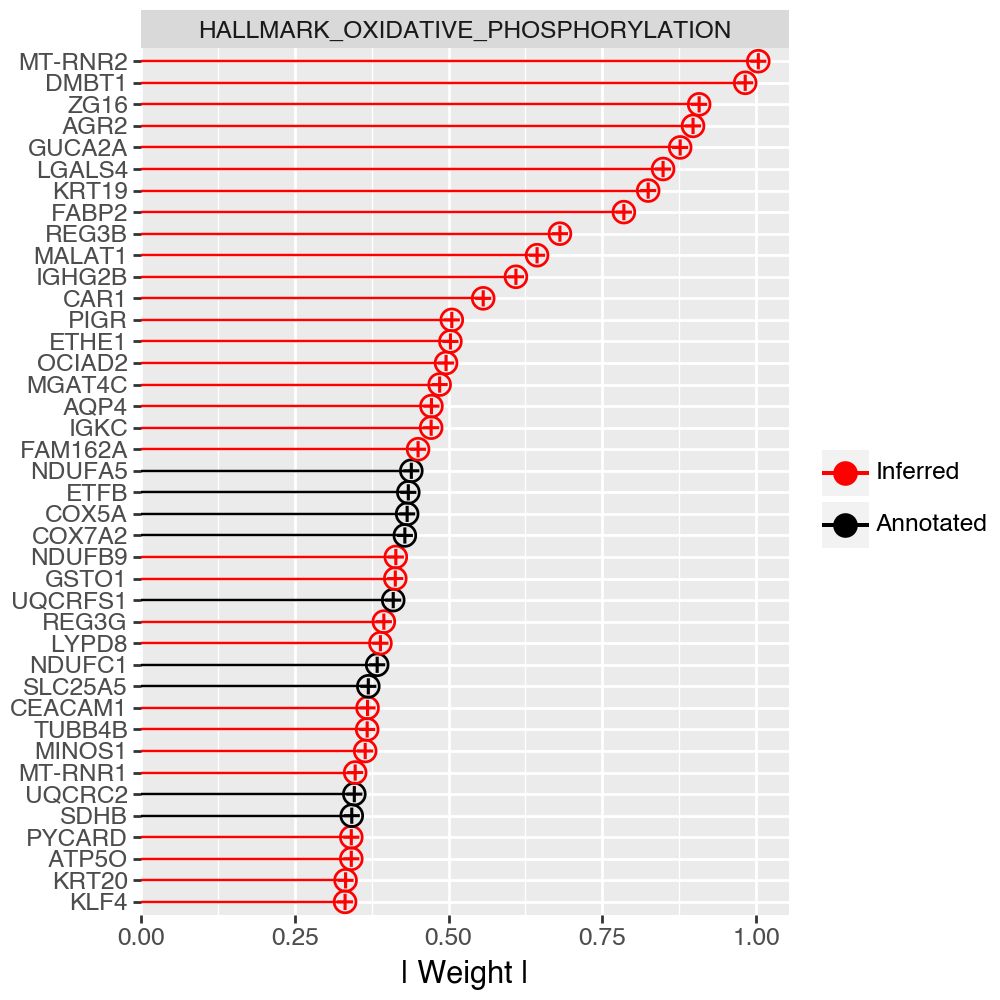

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


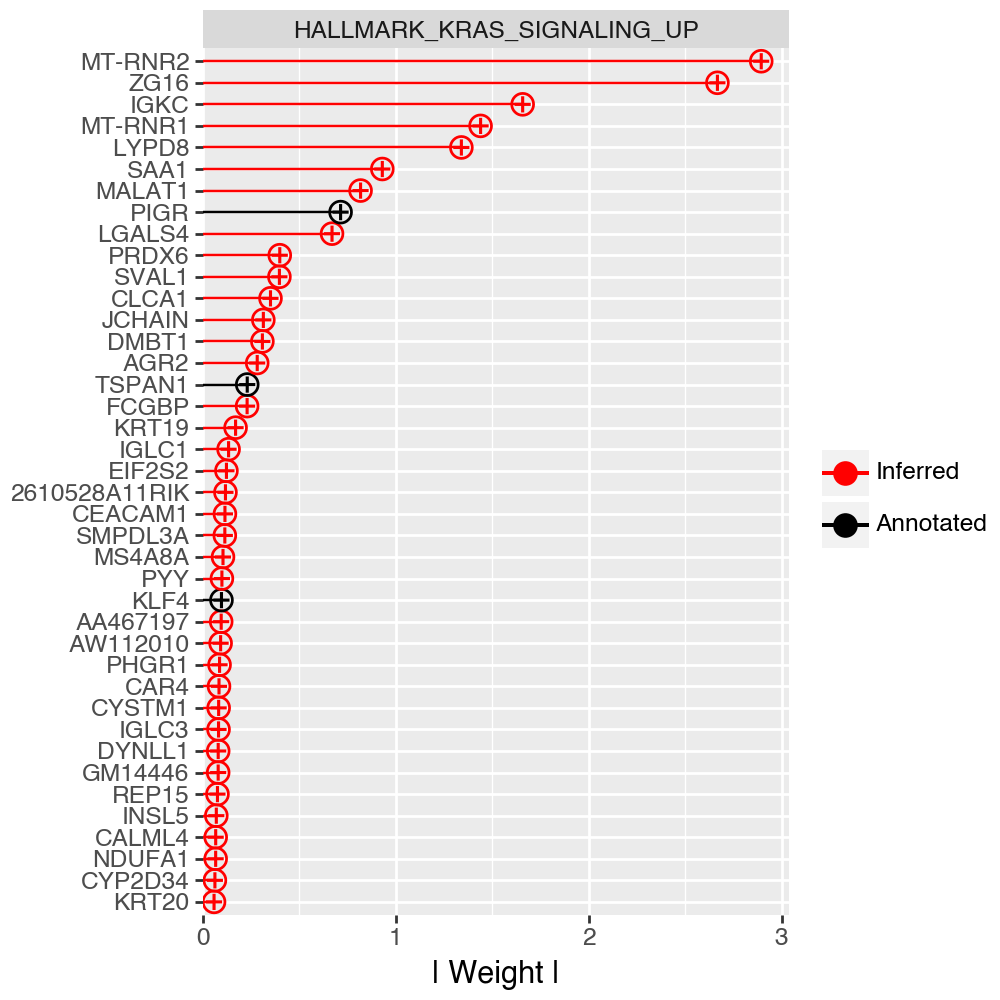

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


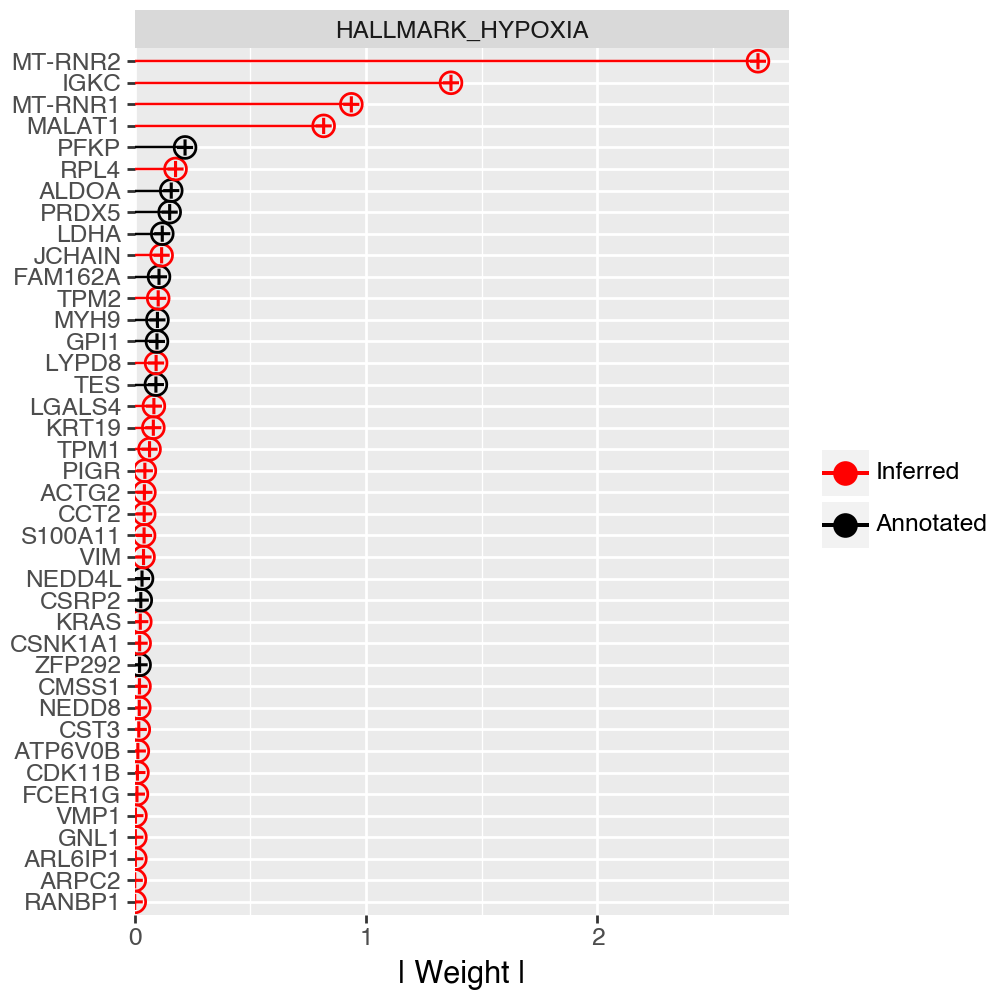

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


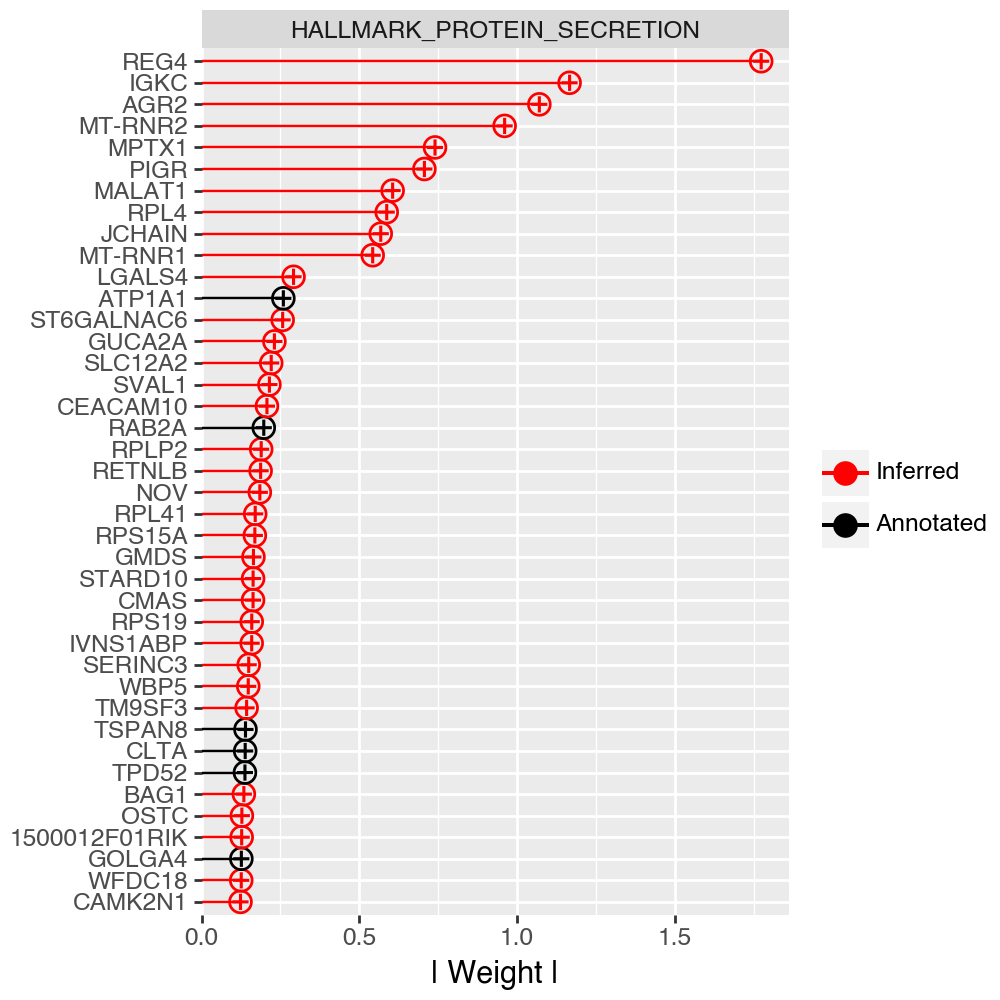

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


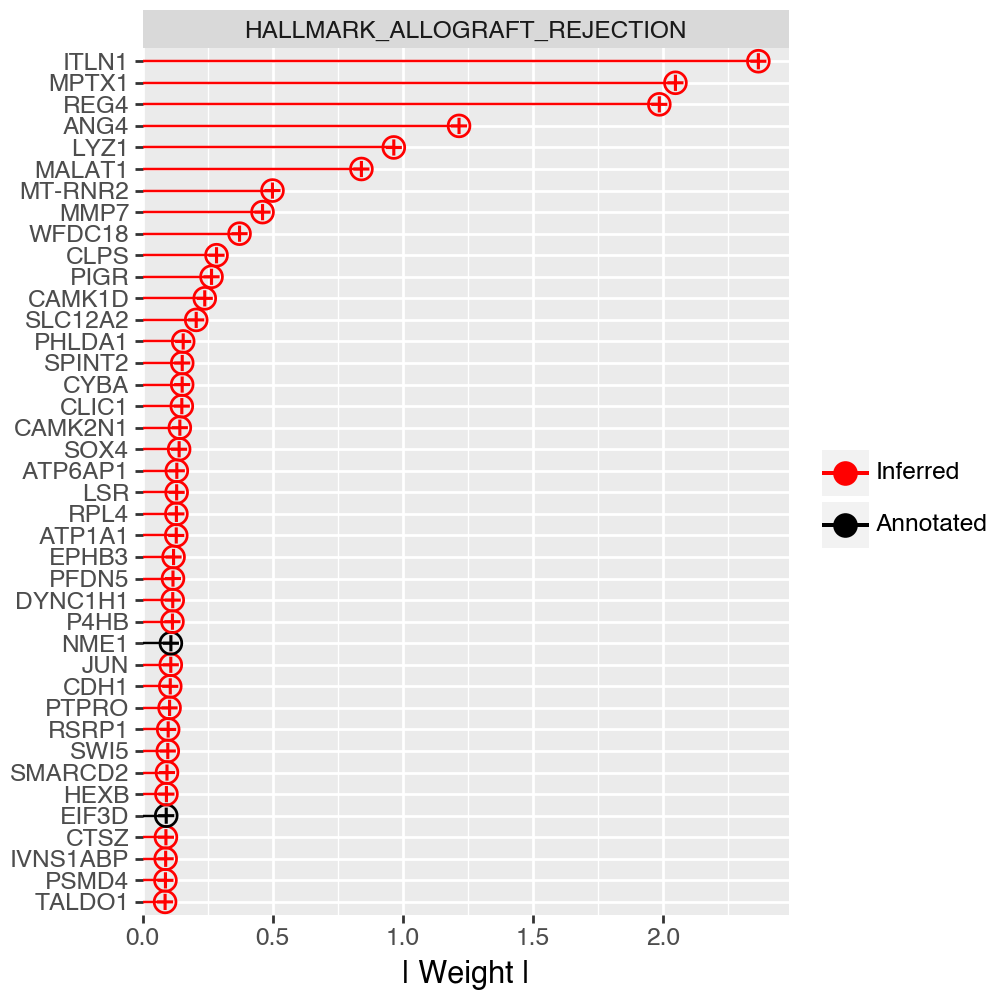

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


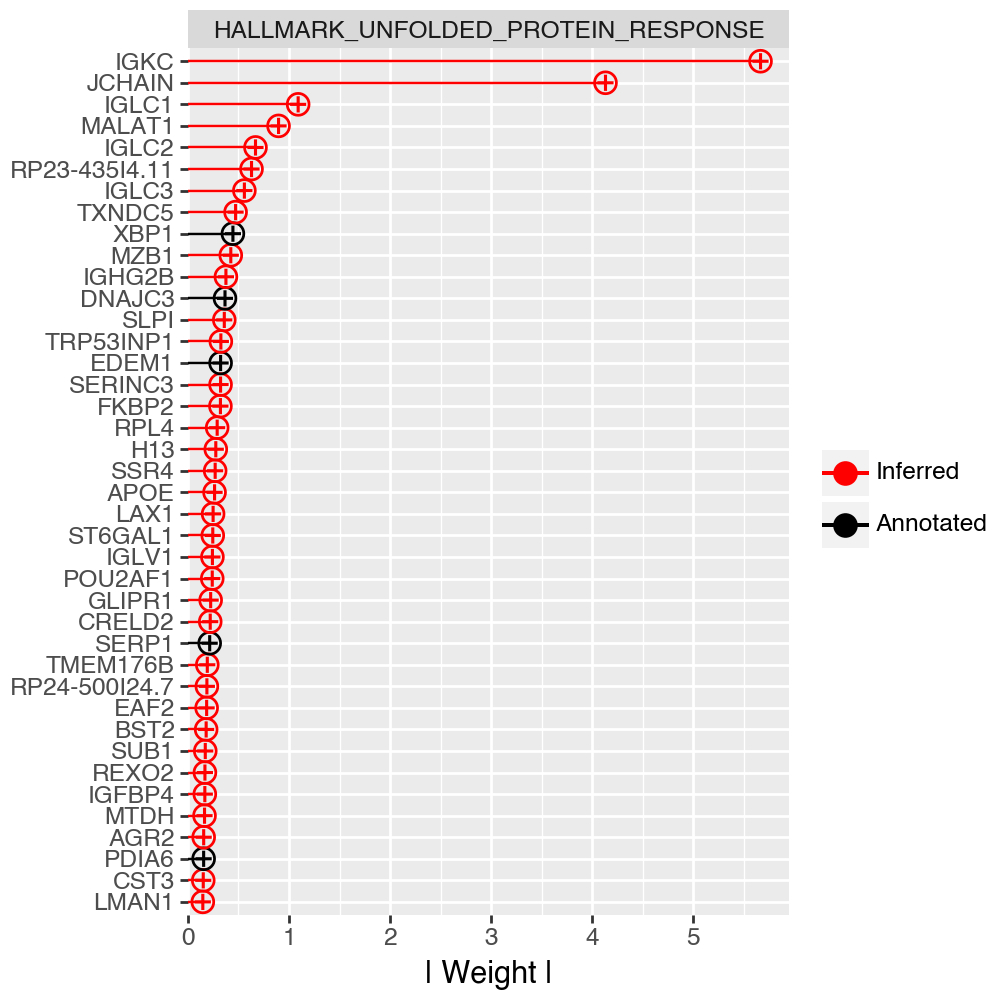

/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:677: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


/data/florin/prismo_project/prismo/src/prismo/pl/_plotting.py:721: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


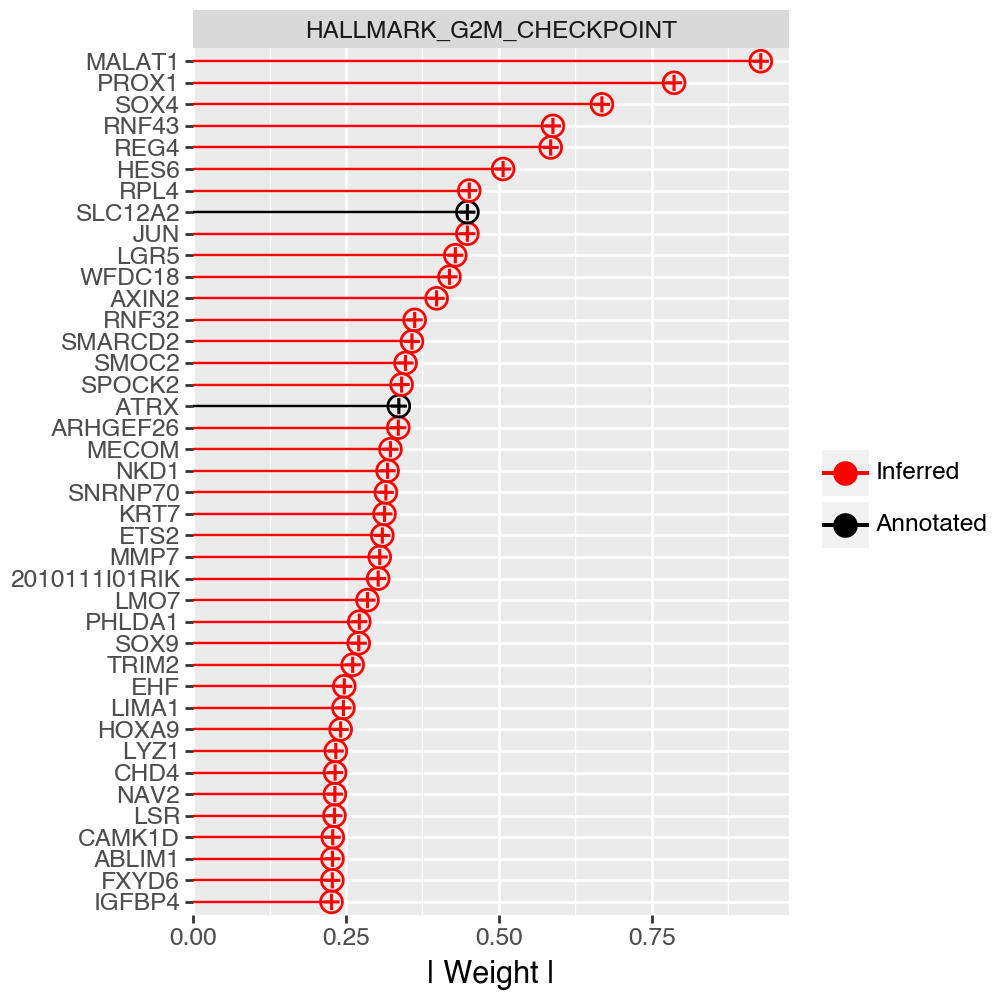

In [77]:
top_factors = r2_long.groupby(["factor", "state"]).r2.mean().reset_index().groupby("factor").r2.std().sort_values(ascending=False).index[:10]

for factor in top_factors:
    factor = "HALLMARK_" + factor.replace(" ", "_").upper()
    plot = plot_top_weights(model, 40, figsize=(5, 5), factors=factor)
    plot.show()